In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import os
import time
from tqdm import tqdm
batch_size = 32

In [2]:
DATA_DIR = "D:/Kaggle/deep-learning/generative-dog-images/data/all-dogs-parent/"
RESULTS_DIR = "D:/Kaggle/deep-learning/generative-dog-images/results/"
MODEL_DIR = "D:/Kaggle/deep-learning/generative-dog-images/models/"
CHK_PTS_DIR = "D:/Kaggle/deep-learning/generative-dog-images/checkpoints/"

In [3]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder(DATA_DIR, transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

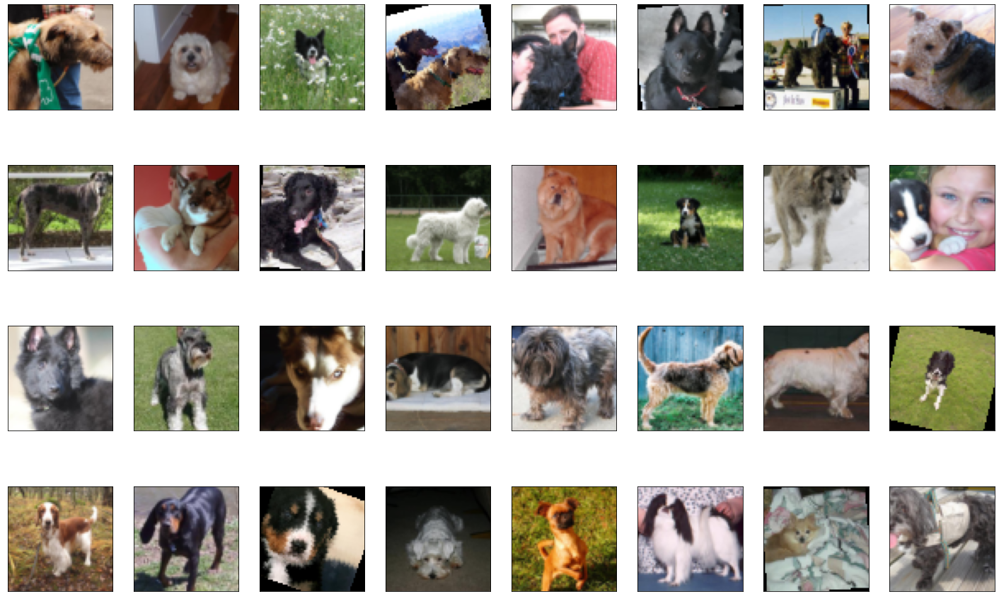

In [4]:
fig = plt.figure(figsize=(25, 16))
for ii, img in enumerate(imgs):
    ax = fig.add_subplot(4, 8, ii + 1, xticks=[], yticks=[])
    
    plt.imshow((img+1.)/2.)

In [5]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [6]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output
# Creating the generator
#Generator = G()
#Generator.apply(weights_init)

In [7]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1,1)
    
# Creating the discriminator
#Discriminator = D()
#Discriminator.apply(weights_init)

In [8]:
batch_size = 32
LR_G = 0.001
LR_D = 0.001

beta1 = 0.5
epochs = 300

real_label = 0.5
fake_label = 0
nz = 100

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [9]:
netG = G().to(device)
netG.apply(weights_init)
netD = D().to(device)
netD.apply(weights_init)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))



In [10]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [11]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow((image_array+1.)/2.)
        
    plt.show()
    plt.close()

In [12]:
MODEL_NAME = "dcgan-v5.pt"
MODEL_PATH=os.path.join(CHK_PTS_DIR,MODEL_NAME)


In [13]:
def train(use_chkpt):
    
    fixed_noise = torch.randn(25, nz, 1, 1, device=device)
    G_losses = []
    D_losses = []
    epoch_time = []
    
    if use_chkpt:
        #print("here")
        checkpoint = torch.load(MODEL_PATH)
        netG.load_state_dict(checkpoint['gen_state_dict'])
        netD.load_state_dict(checkpoint['dis_state_dict'])
        optimizerG.load_state_dict(checkpoint['gen_optimizer_state_dict'])
        optimizerD.load_state_dict(checkpoint['dis_optimizer_state_dict'])
        curr_epoch = checkpoint['epoch']
        errG = checkpoint['gen_loss']
        errD = checkpoint['dis_loss']
        #print(curr_epoch)
    else:
        curr_epoch=0
    #print(curr_epoch)
    for epoch in range(curr_epoch+1,epochs):
        #print(epoch)
        start = time.time()
        for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            # train with real
            netD.zero_grad()
            real_images = real_images.to(device)
            batch_size = real_images.size(0)
            #labels = torch.full((batch_size, 1), real_label, device=device)
            labels = (0.9-0.6)*torch.rand((batch_size, 1),device=device) + 0.6

            output = netD(real_images)
            errD_real = criterion(output, labels)
            errD_real.backward()
            D_x = output.mean().item()

            # train with fake
            noise = torch.randn(batch_size, nz, 1, 1, device=device)
            fake = netG(noise)
            #labels.fill_(fake_label)
            labels = (0.3-0.0)*torch.rand((batch_size, 1),device=device) + 0.0
            output = netD(fake.detach())
            errD_fake = criterion(output, labels)
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            errD = errD_real + errD_fake
            optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            netG.zero_grad()
            #labels.fill_(real_label)  # fake labels are real for generator cost
            labels = (0.9-0.6)*torch.rand((batch_size, 1),device=device) + 0.6
            output = netD(fake)
            errG = criterion(output, labels)
            errG.backward()
            D_G_z2 = output.mean().item()
            optimizerG.step()

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            if (ii+1) % (len(train_loader)//2) == 0:
                print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                      % (epoch + 1, epochs, ii+1, len(train_loader),
                         errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))


        if epoch % 1 == 0:
            show_generated_img()
            torch.save({
                'epoch': epoch,
                'gen_state_dict': netG.state_dict(),
                'gen_optimizer_state_dict': optimizerG.state_dict(),
                'dis_state_dict': netD.state_dict(),
                'dis_optimizer_state_dict': optimizerD.state_dict(),
                'gen_loss': errG,
                'dis_loss': errD,
                }, MODEL_PATH)

        plot_loss (G_losses, D_losses, epoch)
        G_losses = []
        D_losses = []

        epoch_time.append(time.time()- start)

 50%|████████████████████████████████████████                                        | 322/644 [03:27<03:25,  1.57it/s]

[2/300][322/644] Loss_D: 1.3799 Loss_G: 1.2521 D(x): 0.5811 D(G(z)): 0.5038 / 0.2510


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [06:51<00:00,  1.56it/s]


[2/300][644/644] Loss_D: 1.9766 Loss_G: 4.6467 D(x): 0.8044 D(G(z)): 0.7621 / 0.0031


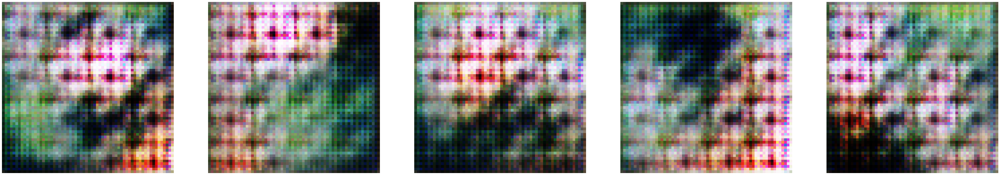

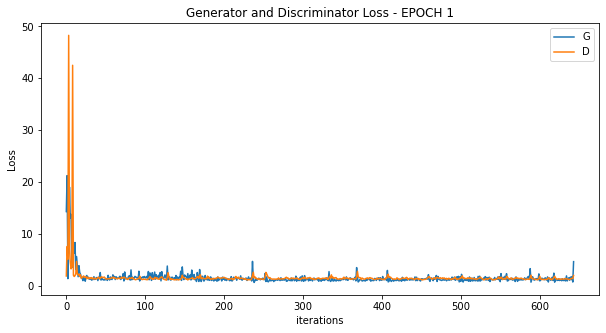

 50%|████████████████████████████████████████                                        | 322/644 [03:18<05:00,  1.07it/s]

[3/300][322/644] Loss_D: 1.4015 Loss_G: 0.8817 D(x): 0.4113 D(G(z)): 0.3268 / 0.3886


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [08:21<00:00,  1.29it/s]

[3/300][644/644] Loss_D: 1.7224 Loss_G: 0.5866 D(x): 0.2646 D(G(z)): 0.2507 / 0.5834


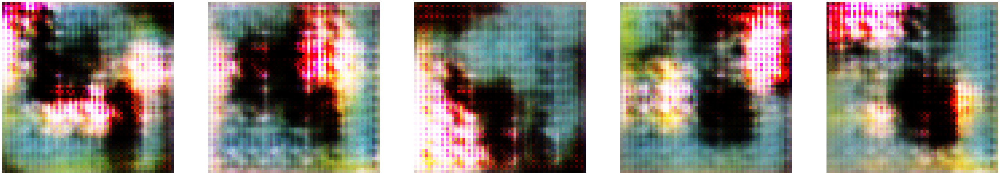

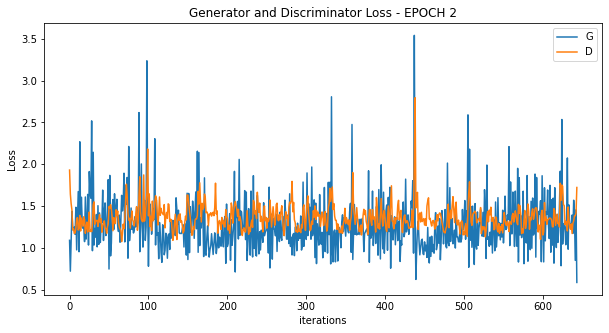

 50%|████████████████████████████████████████                                        | 322/644 [05:11<04:58,  1.08it/s]

[4/300][322/644] Loss_D: 1.1842 Loss_G: 1.4120 D(x): 0.6945 D(G(z)): 0.3971 / 0.1748


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:33<00:00,  1.02it/s]

[4/300][644/644] Loss_D: 1.2440 Loss_G: 6.6542 D(x): 0.6658 D(G(z)): 0.3260 / 0.0002


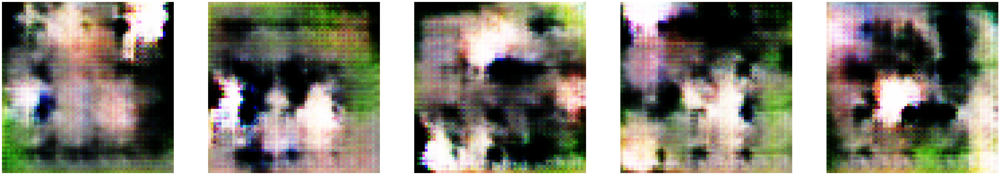

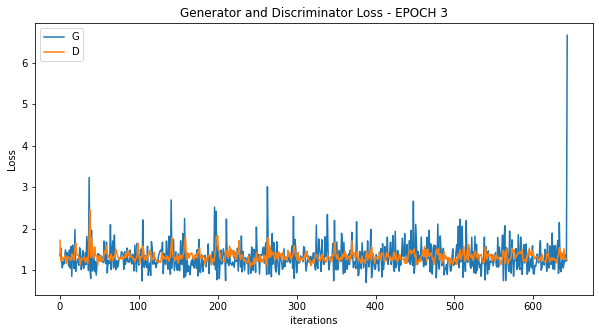

 50%|████████████████████████████████████████                                        | 322/644 [05:36<05:20,  1.00it/s]

[5/300][322/644] Loss_D: 1.4073 Loss_G: 0.9496 D(x): 0.4417 D(G(z)): 0.3763 / 0.3598


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.04s/it]

[5/300][644/644] Loss_D: 1.0135 Loss_G: 2.6310 D(x): 0.7027 D(G(z)): 0.2659 / 0.0293


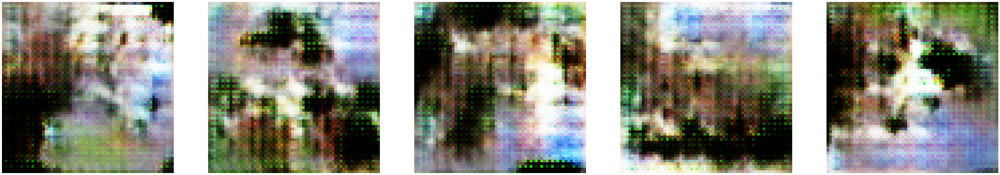

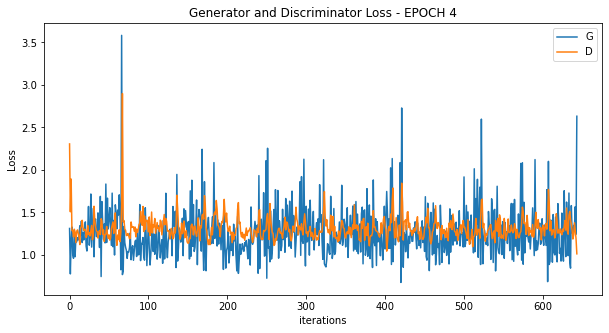

 50%|████████████████████████████████████████                                        | 322/644 [05:41<06:31,  1.22s/it]

[6/300][322/644] Loss_D: 1.2197 Loss_G: 1.1534 D(x): 0.5170 D(G(z)): 0.2927 / 0.2694


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:07<00:00,  1.04s/it]

[6/300][644/644] Loss_D: 1.6710 Loss_G: 4.1526 D(x): 0.5816 D(G(z)): 0.6056 / 0.0278


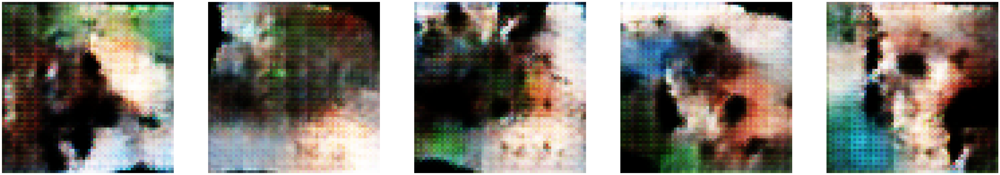

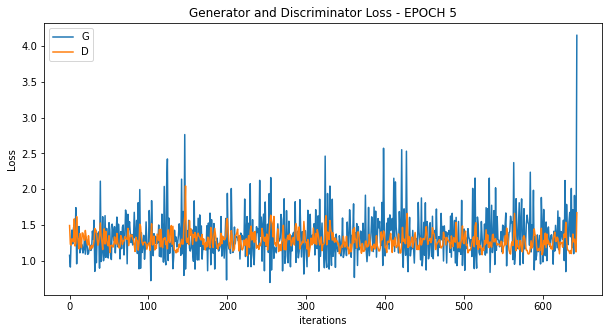

 50%|████████████████████████████████████████                                        | 322/644 [05:24<05:46,  1.07s/it]

[7/300][322/644] Loss_D: 1.3288 Loss_G: 1.4158 D(x): 0.6000 D(G(z)): 0.4385 / 0.1887


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:51<00:00,  1.01s/it]

[7/300][644/644] Loss_D: 1.0944 Loss_G: 1.6619 D(x): 0.6083 D(G(z)): 0.2757 / 0.1314


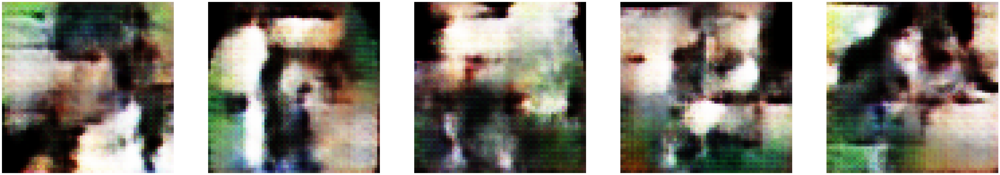

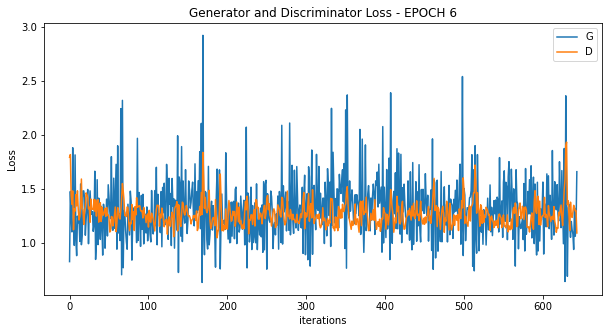

 50%|████████████████████████████████████████                                        | 322/644 [05:22<06:02,  1.13s/it]

[8/300][322/644] Loss_D: 1.1404 Loss_G: 1.5265 D(x): 0.6268 D(G(z)): 0.2649 / 0.1490


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:47<00:00,  1.00s/it]

[8/300][644/644] Loss_D: 1.3383 Loss_G: 1.4559 D(x): 0.3816 D(G(z)): 0.2400 / 0.2578


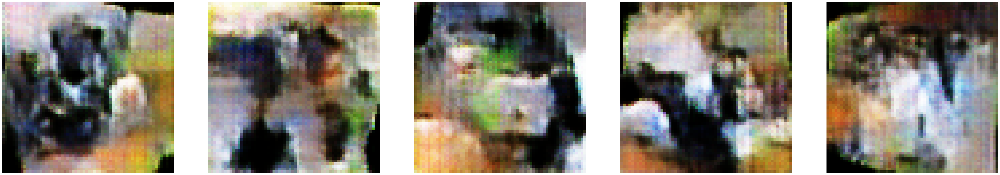

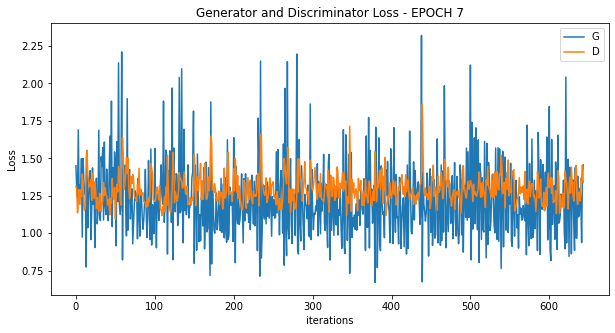

 50%|████████████████████████████████████████                                        | 322/644 [05:27<05:00,  1.07it/s]

[9/300][322/644] Loss_D: 1.5504 Loss_G: 1.0836 D(x): 0.5402 D(G(z)): 0.5834 / 0.2663


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:48<00:00,  1.01s/it]

[9/300][644/644] Loss_D: 1.2123 Loss_G: 1.7952 D(x): 0.5357 D(G(z)): 0.2992 / 0.1370


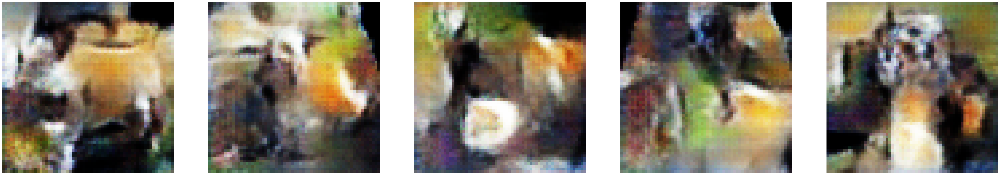

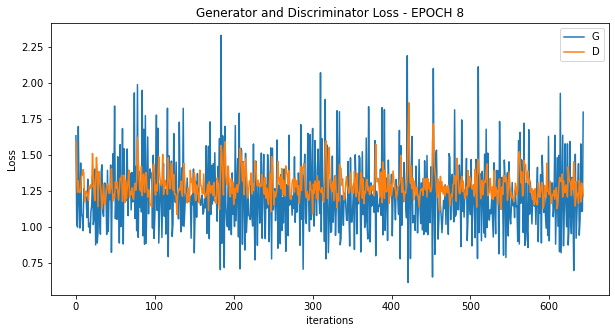

 50%|████████████████████████████████████████                                        | 322/644 [05:38<05:06,  1.05it/s]

[10/300][322/644] Loss_D: 1.4204 Loss_G: 0.9712 D(x): 0.3291 D(G(z)): 0.1759 / 0.3339


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:10<00:00,  1.04s/it]

[10/300][644/644] Loss_D: 1.3911 Loss_G: 5.1744 D(x): 0.7372 D(G(z)): 0.5768 / 0.0084


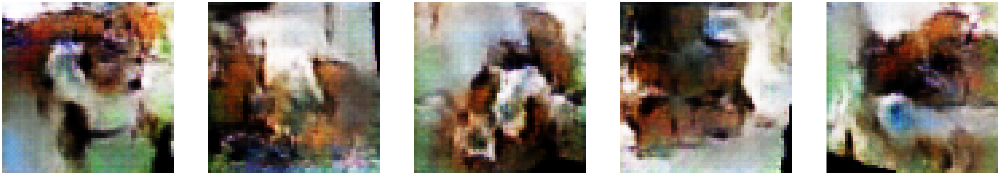

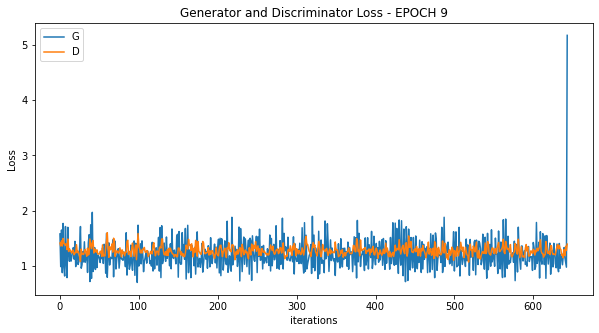

 50%|████████████████████████████████████████                                        | 322/644 [05:25<07:32,  1.41s/it]

[11/300][322/644] Loss_D: 1.1851 Loss_G: 1.4257 D(x): 0.6191 D(G(z)): 0.3843 / 0.1816


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:11<00:00,  1.04s/it]

[11/300][644/644] Loss_D: 1.5993 Loss_G: 0.6285 D(x): 0.4236 D(G(z)): 0.1090 / 0.8976


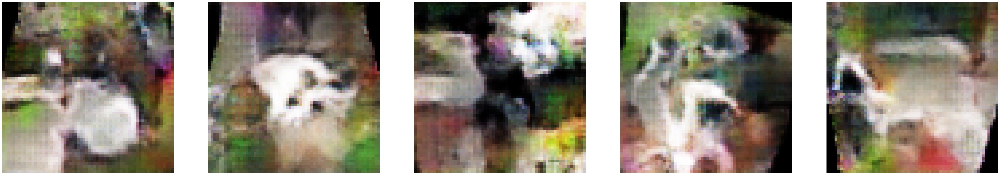

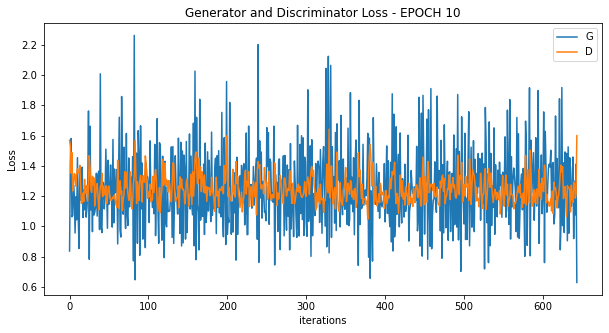

 50%|████████████████████████████████████████                                        | 322/644 [05:30<06:48,  1.27s/it]

[12/300][322/644] Loss_D: 1.2146 Loss_G: 1.6817 D(x): 0.6278 D(G(z)): 0.3863 / 0.1280


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:55<00:00,  1.02s/it]

[12/300][644/644] Loss_D: 1.6560 Loss_G: 0.7201 D(x): 0.3104 D(G(z)): 0.0839 / 0.7726


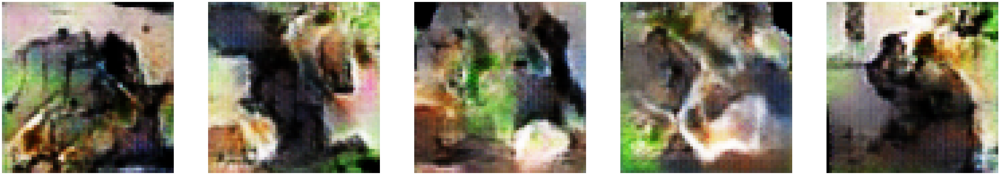

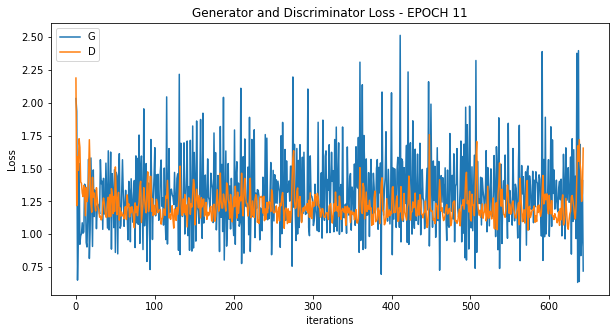

 50%|████████████████████████████████████████                                        | 322/644 [05:37<05:02,  1.07it/s]

[13/300][322/644] Loss_D: 1.0941 Loss_G: 1.2889 D(x): 0.6246 D(G(z)): 0.1554 / 0.2018


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]

[13/300][644/644] Loss_D: 1.1028 Loss_G: 1.3687 D(x): 0.7339 D(G(z)): 0.2142 / 0.3215


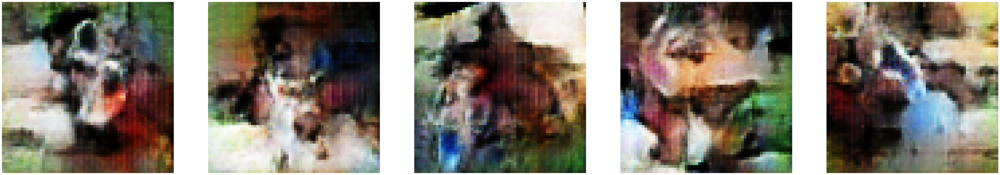

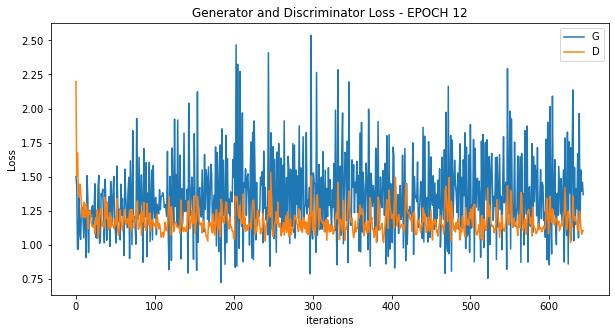

 50%|████████████████████████████████████████                                        | 322/644 [05:37<04:59,  1.08it/s]

[14/300][322/644] Loss_D: 1.1971 Loss_G: 1.6628 D(x): 0.7555 D(G(z)): 0.3781 / 0.1214


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:26<00:00,  1.07s/it]

[14/300][644/644] Loss_D: 1.3476 Loss_G: 1.6578 D(x): 0.3625 D(G(z)): 0.1974 / 0.2477


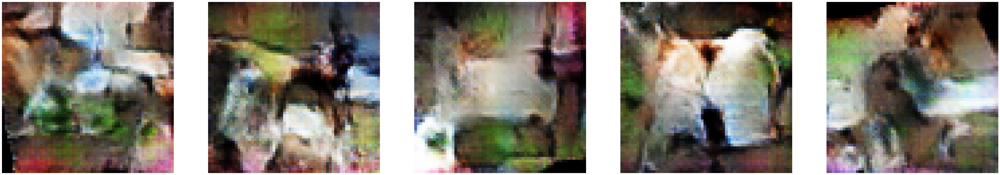

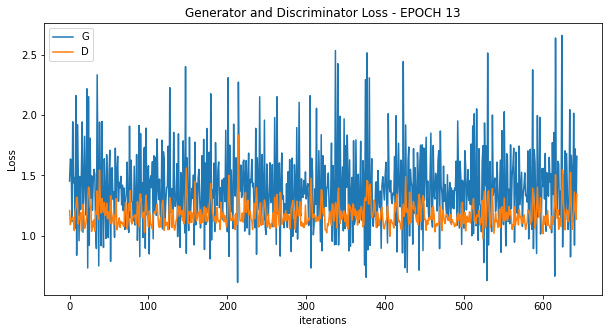

 50%|████████████████████████████████████████                                        | 322/644 [05:28<05:49,  1.09s/it]

[15/300][322/644] Loss_D: 1.0928 Loss_G: 1.5898 D(x): 0.6231 D(G(z)): 0.2239 / 0.1339


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:53<00:00,  1.01s/it]

[15/300][644/644] Loss_D: 2.1658 Loss_G: 0.7335 D(x): 0.1135 D(G(z)): 0.0906 / 0.5057


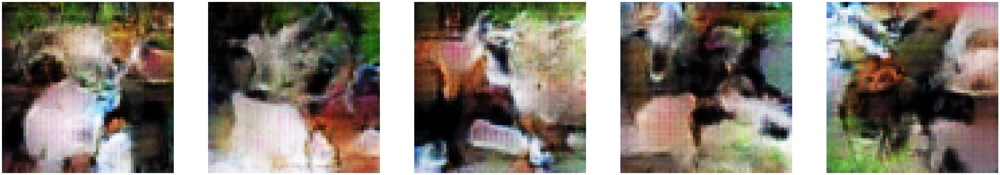

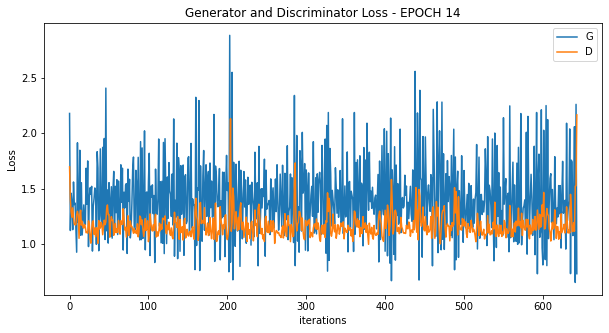

 50%|████████████████████████████████████████                                        | 322/644 [05:35<05:50,  1.09s/it]

[16/300][322/644] Loss_D: 1.1579 Loss_G: 1.8243 D(x): 0.7679 D(G(z)): 0.3444 / 0.1071


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:54<00:00,  1.02s/it]

[16/300][644/644] Loss_D: 1.1747 Loss_G: 0.9627 D(x): 0.3603 D(G(z)): 0.1410 / 0.4407


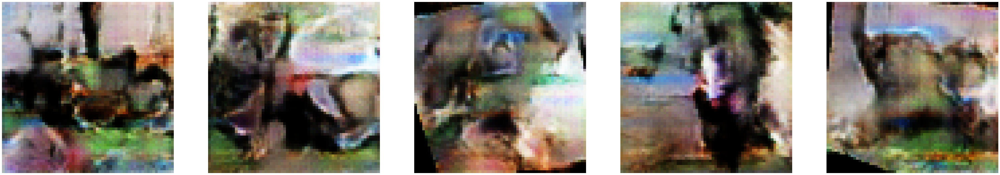

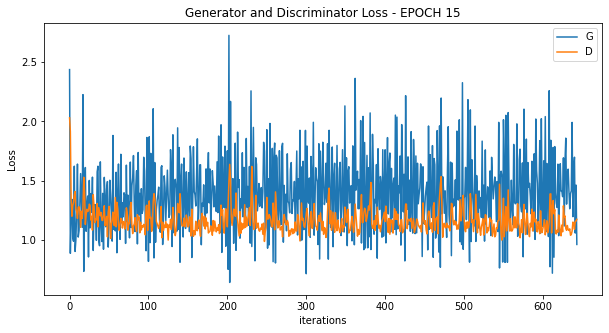

 50%|████████████████████████████████████████                                        | 322/644 [05:37<04:58,  1.08it/s]

[17/300][322/644] Loss_D: 1.0582 Loss_G: 1.7847 D(x): 0.6732 D(G(z)): 0.2302 / 0.0990


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:07<00:00,  1.04s/it]

[17/300][644/644] Loss_D: 1.2447 Loss_G: 0.7610 D(x): 0.5202 D(G(z)): 0.1267 / 0.7532


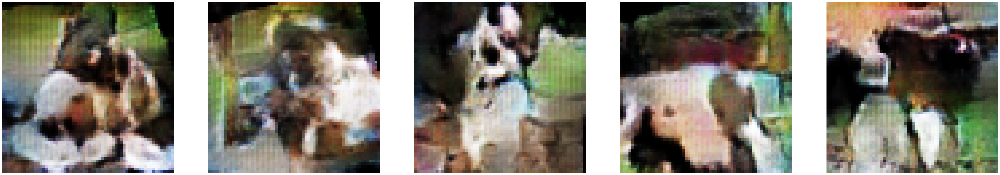

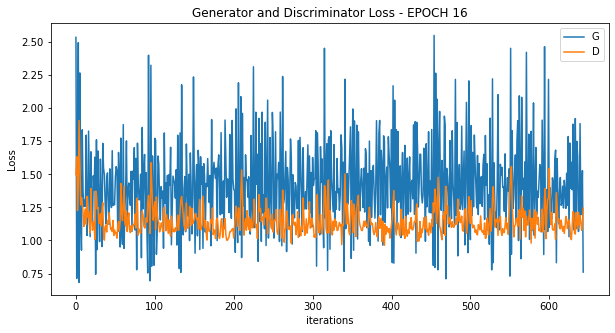

 50%|████████████████████████████████████████                                        | 322/644 [05:22<05:00,  1.07it/s]

[18/300][322/644] Loss_D: 1.2203 Loss_G: 2.2527 D(x): 0.8527 D(G(z)): 0.4121 / 0.0581


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]

[18/300][644/644] Loss_D: 1.0831 Loss_G: 1.3558 D(x): 0.4239 D(G(z)): 0.1010 / 0.3080


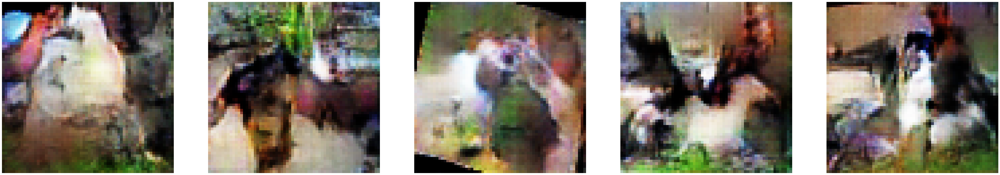

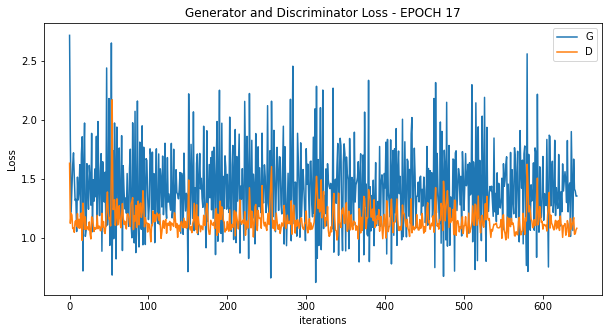

 50%|████████████████████████████████████████                                        | 322/644 [05:22<05:49,  1.08s/it]

[19/300][322/644] Loss_D: 1.2183 Loss_G: 0.9606 D(x): 0.4395 D(G(z)): 0.2086 / 0.3353


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:56<00:00,  1.02s/it]

[19/300][644/644] Loss_D: 1.2826 Loss_G: 0.7232 D(x): 0.4208 D(G(z)): 0.1502 / 0.8348


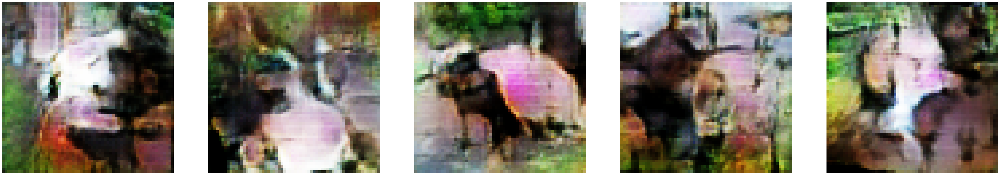

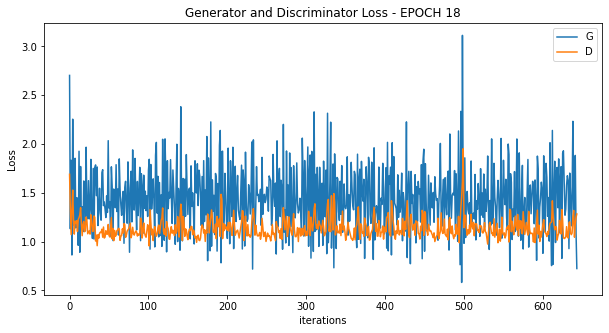

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:00,  1.07it/s]

[20/300][322/644] Loss_D: 1.0769 Loss_G: 1.1994 D(x): 0.6439 D(G(z)): 0.1637 / 0.2483


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:01<00:00,  1.03s/it]

[20/300][644/644] Loss_D: 1.1936 Loss_G: 1.2330 D(x): 0.5051 D(G(z)): 0.1553 / 0.2262


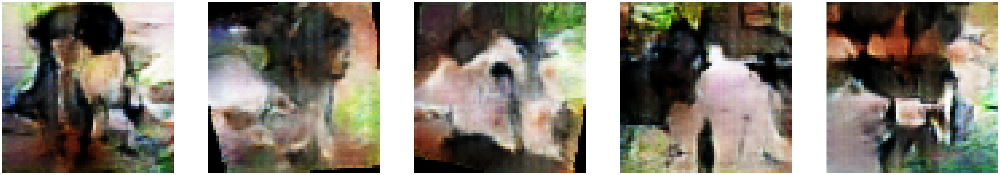

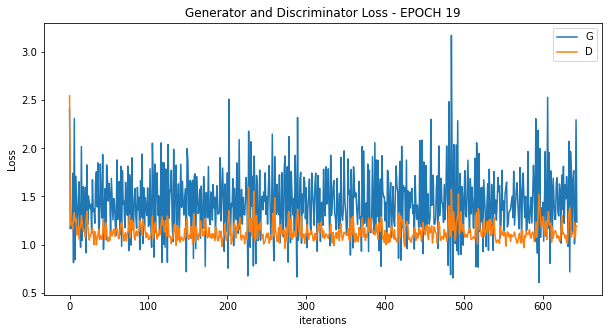

 50%|████████████████████████████████████████                                        | 322/644 [05:27<05:05,  1.06it/s]

[21/300][322/644] Loss_D: 1.4290 Loss_G: 2.3455 D(x): 0.8251 D(G(z)): 0.5648 / 0.0496


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:53<00:00,  1.01s/it]

[21/300][644/644] Loss_D: 1.4296 Loss_G: 0.8005 D(x): 0.3017 D(G(z)): 0.1353 / 0.7732


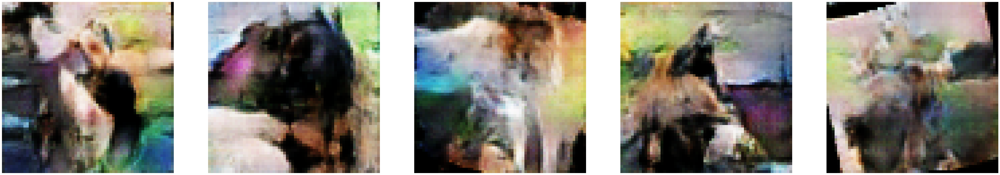

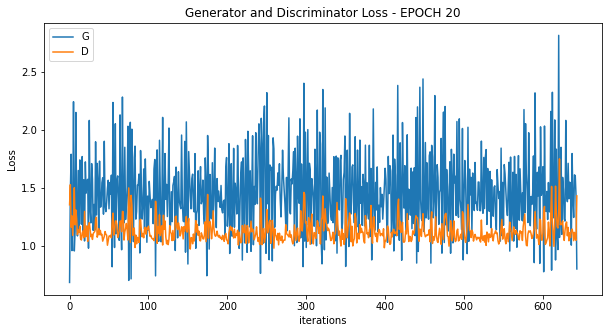

 50%|████████████████████████████████████████                                        | 322/644 [05:23<05:01,  1.07it/s]

[22/300][322/644] Loss_D: 1.0689 Loss_G: 1.1433 D(x): 0.6051 D(G(z)): 0.2252 / 0.2536


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]


[22/300][644/644] Loss_D: 1.1329 Loss_G: 5.8407 D(x): 0.7022 D(G(z)): 0.3730 / 0.0018


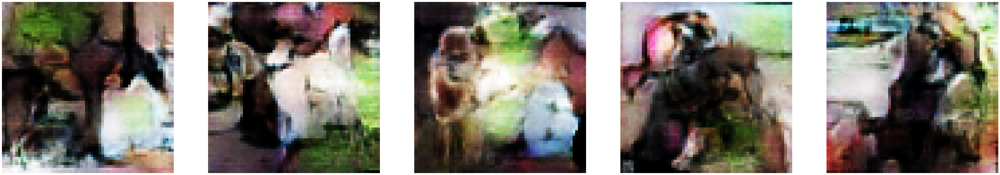

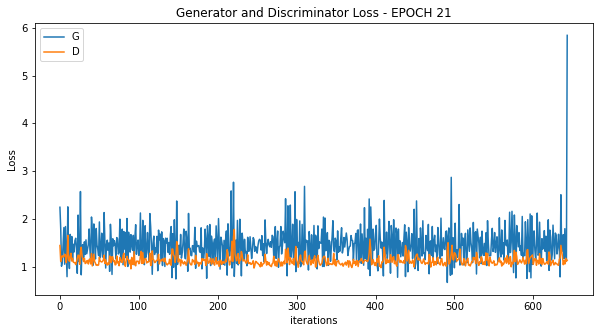

 50%|████████████████████████████████████████                                        | 322/644 [05:20<05:47,  1.08s/it]

[23/300][322/644] Loss_D: 1.0821 Loss_G: 1.4334 D(x): 0.6986 D(G(z)): 0.3069 / 0.1645


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:53<00:00,  1.01s/it]

[23/300][644/644] Loss_D: 1.0690 Loss_G: 2.9696 D(x): 0.8077 D(G(z)): 0.1323 / 0.0278


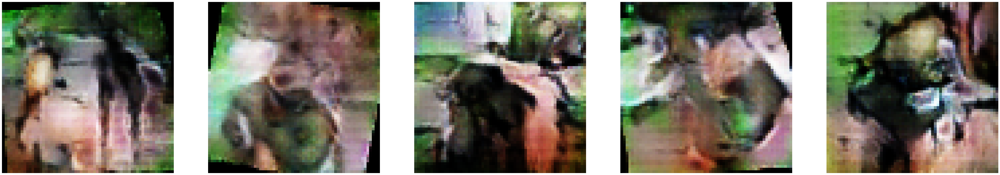

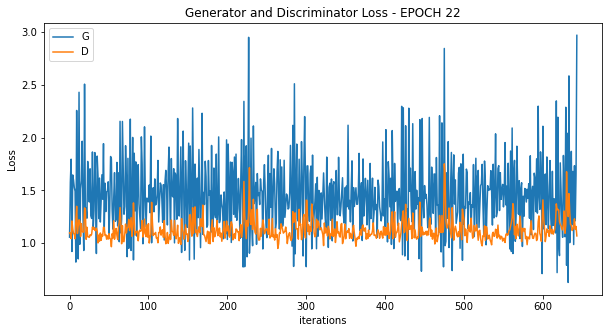

 50%|████████████████████████████████████████                                        | 322/644 [05:32<05:43,  1.07s/it]

[24/300][322/644] Loss_D: 1.2181 Loss_G: 0.9636 D(x): 0.4904 D(G(z)): 0.0839 / 0.3318


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:49<00:00,  1.01s/it]

[24/300][644/644] Loss_D: 1.0920 Loss_G: 2.4599 D(x): 0.7293 D(G(z)): 0.2592 / 0.1610


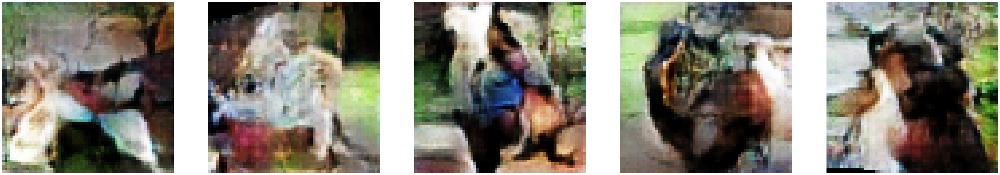

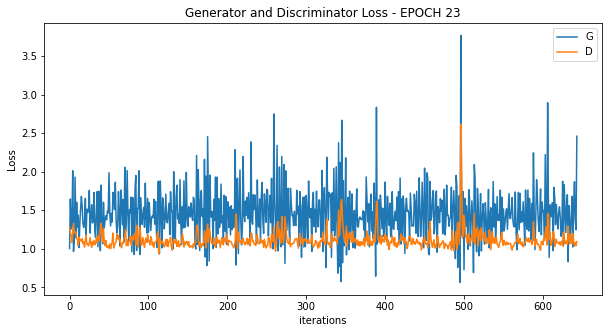

 50%|████████████████████████████████████████                                        | 322/644 [05:42<05:03,  1.06it/s]

[25/300][322/644] Loss_D: 1.0544 Loss_G: 1.6247 D(x): 0.7079 D(G(z)): 0.2521 / 0.1341


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.04s/it]

[25/300][644/644] Loss_D: 1.5762 Loss_G: 0.6601 D(x): 0.2682 D(G(z)): 0.1097 / 0.8357


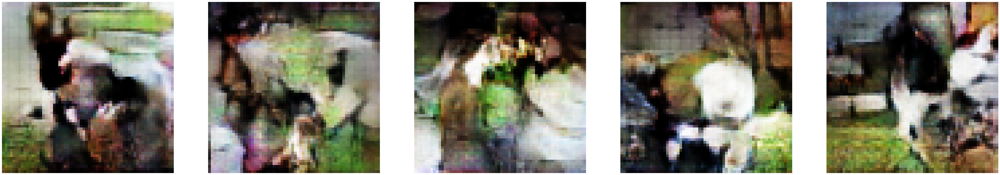

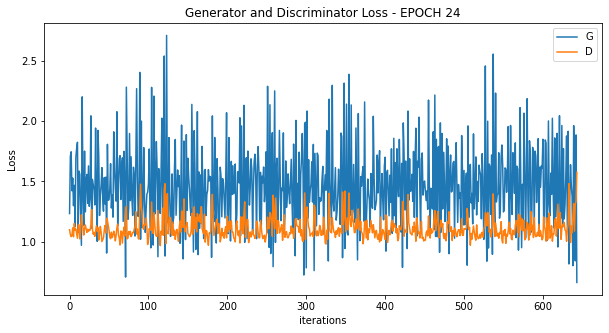

 50%|████████████████████████████████████████                                        | 322/644 [05:29<05:04,  1.06it/s]

[26/300][322/644] Loss_D: 1.2671 Loss_G: 2.4023 D(x): 0.8560 D(G(z)): 0.4371 / 0.0464


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:02<00:00,  1.03s/it]

[26/300][644/644] Loss_D: 1.0813 Loss_G: 1.8414 D(x): 0.4516 D(G(z)): 0.1885 / 0.0702


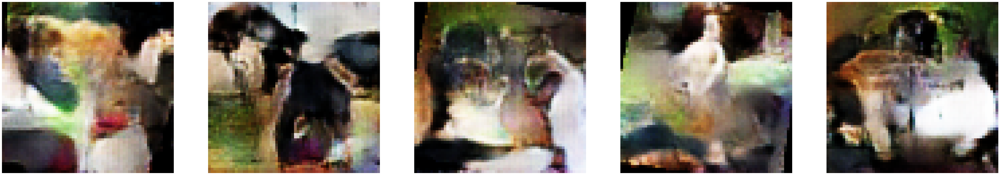

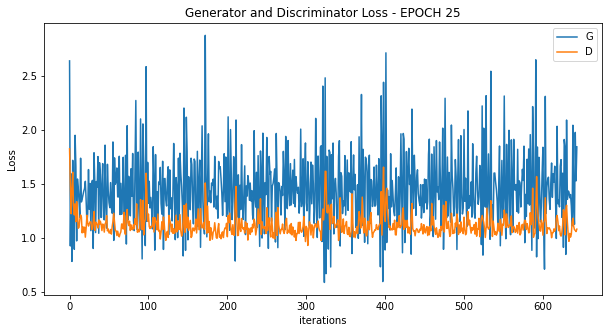

 50%|████████████████████████████████████████                                        | 322/644 [05:26<05:02,  1.06it/s]

[27/300][322/644] Loss_D: 1.0461 Loss_G: 1.4541 D(x): 0.7220 D(G(z)): 0.3074 / 0.1627


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:05<00:00,  1.03s/it]

[27/300][644/644] Loss_D: 1.3522 Loss_G: 4.4757 D(x): 0.4584 D(G(z)): 0.3451 / 0.0147


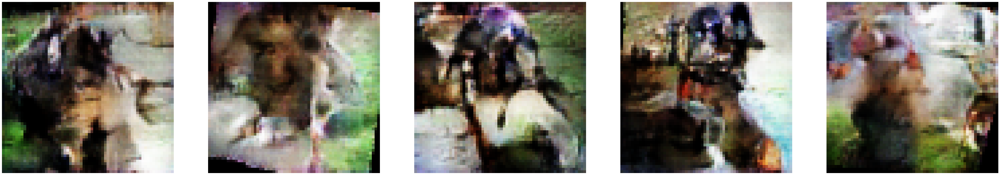

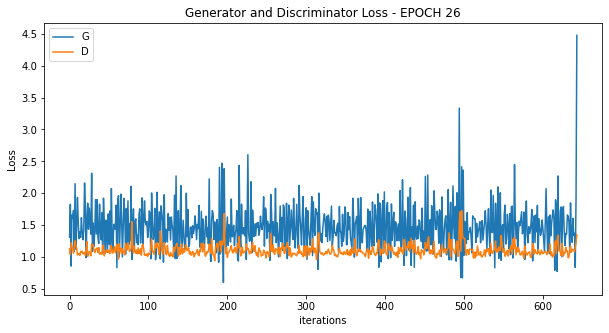

 50%|████████████████████████████████████████                                        | 322/644 [05:25<05:44,  1.07s/it]

[28/300][322/644] Loss_D: 1.0821 Loss_G: 1.6899 D(x): 0.7548 D(G(z)): 0.3191 / 0.1076


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:53<00:00,  1.02s/it]

[28/300][644/644] Loss_D: 1.9111 Loss_G: 0.7886 D(x): 0.2177 D(G(z)): 0.1404 / 0.8830


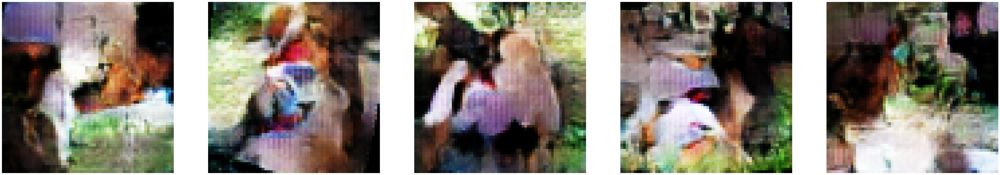

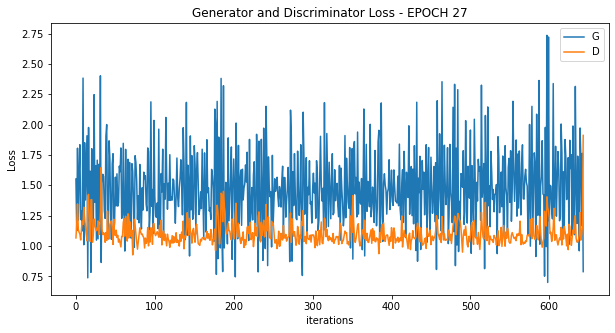

 50%|████████████████████████████████████████                                        | 322/644 [05:36<04:58,  1.08it/s]

[29/300][322/644] Loss_D: 1.1218 Loss_G: 1.6615 D(x): 0.8006 D(G(z)): 0.3558 / 0.1114


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:04<00:00,  1.03s/it]

[29/300][644/644] Loss_D: 2.1090 Loss_G: 0.7980 D(x): 0.1194 D(G(z)): 0.0890 / 0.9447


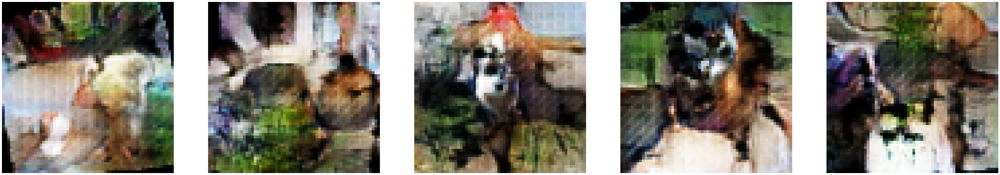

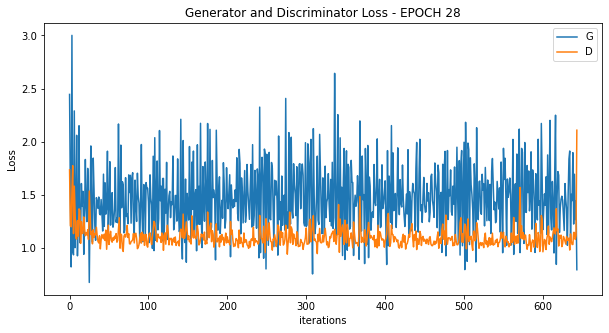

 50%|████████████████████████████████████████                                        | 322/644 [05:31<05:02,  1.06it/s]

[30/300][322/644] Loss_D: 1.0138 Loss_G: 1.3773 D(x): 0.6041 D(G(z)): 0.1943 / 0.1894


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:07<00:00,  1.04s/it]

[30/300][644/644] Loss_D: 1.0270 Loss_G: 1.1172 D(x): 0.6331 D(G(z)): 0.1476 / 0.2706


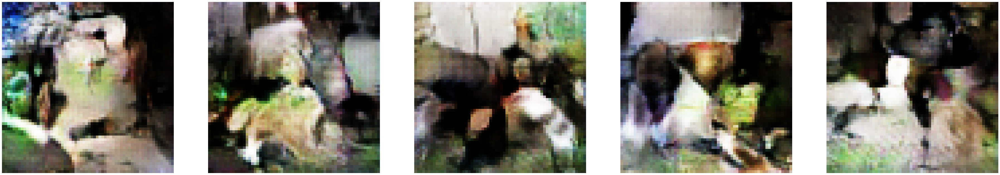

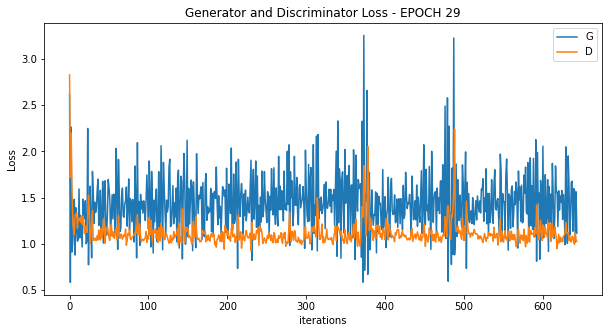

 50%|████████████████████████████████████████                                        | 322/644 [05:21<05:04,  1.06it/s]

[31/300][322/644] Loss_D: 1.2761 Loss_G: 0.9043 D(x): 0.4186 D(G(z)): 0.0774 / 0.3698


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:03<00:00,  1.03s/it]

[31/300][644/644] Loss_D: 0.9835 Loss_G: 2.9962 D(x): 0.5895 D(G(z)): 0.2163 / 0.0375


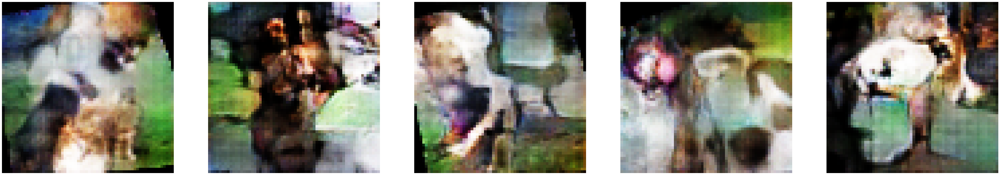

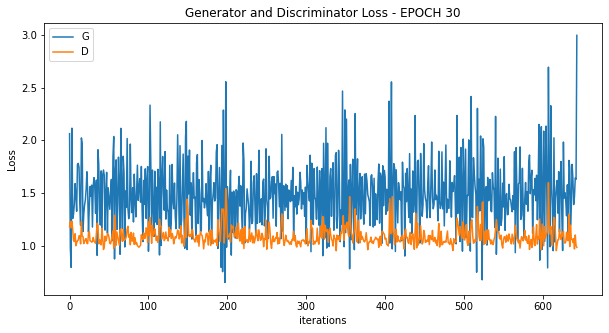

 50%|████████████████████████████████████████                                        | 322/644 [05:27<05:51,  1.09s/it]

[32/300][322/644] Loss_D: 1.0701 Loss_G: 1.4845 D(x): 0.6516 D(G(z)): 0.1542 / 0.1565


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:56<00:00,  1.02s/it]

[32/300][644/644] Loss_D: 1.0608 Loss_G: 1.4711 D(x): 0.6293 D(G(z)): 0.2269 / 0.1836


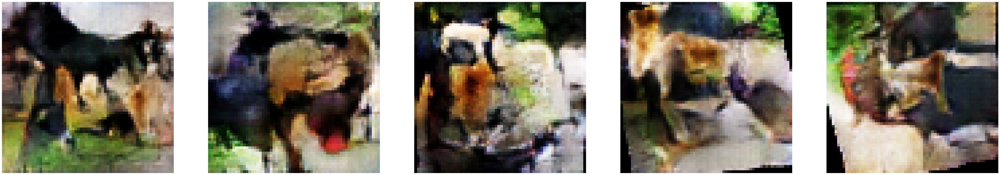

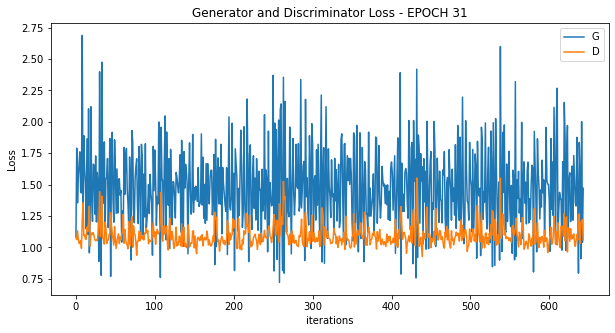

 50%|████████████████████████████████████████                                        | 322/644 [05:26<05:50,  1.09s/it]

[33/300][322/644] Loss_D: 1.0947 Loss_G: 1.3382 D(x): 0.5315 D(G(z)): 0.1181 / 0.2152


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:51<00:00,  1.01s/it]

[33/300][644/644] Loss_D: 1.3733 Loss_G: 0.6525 D(x): 0.3446 D(G(z)): 0.2545 / 0.6580


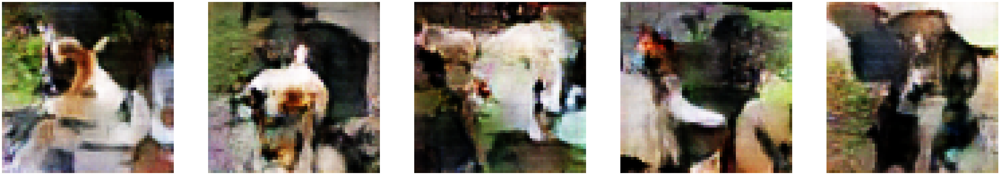

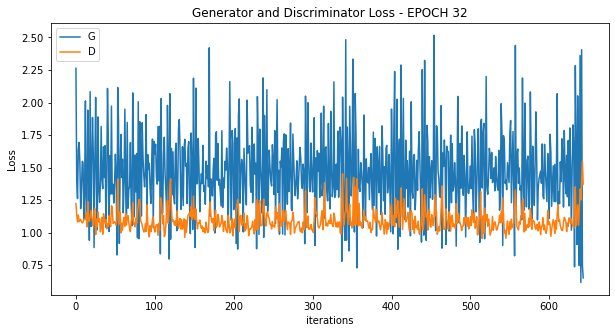

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:13,  1.03it/s]

[34/300][322/644] Loss_D: 1.1204 Loss_G: 1.2161 D(x): 0.5971 D(G(z)): 0.1695 / 0.2279


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:53<00:00,  1.01s/it]

[34/300][644/644] Loss_D: 1.6515 Loss_G: 0.5984 D(x): 0.2816 D(G(z)): 0.0616 / 0.8947


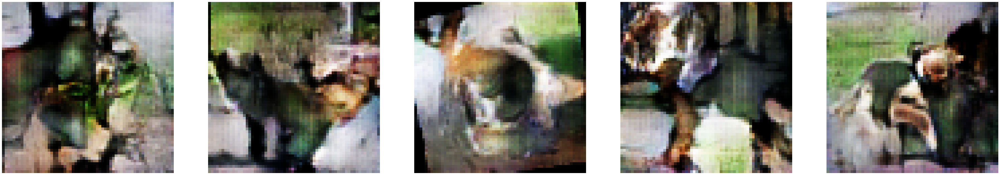

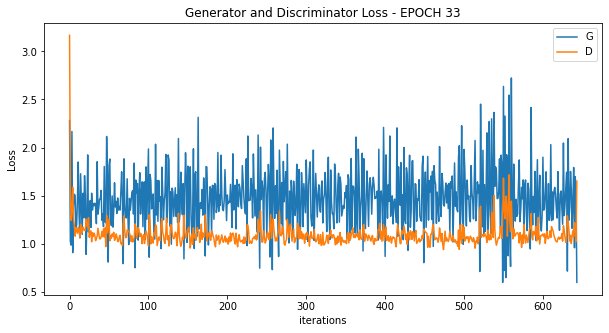

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:00,  1.07it/s]

[35/300][322/644] Loss_D: 1.0344 Loss_G: 1.8213 D(x): 0.7349 D(G(z)): 0.2693 / 0.0916


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:56<00:00,  1.02s/it]

[35/300][644/644] Loss_D: 1.3419 Loss_G: 0.7264 D(x): 0.4115 D(G(z)): 0.0649 / 0.7552


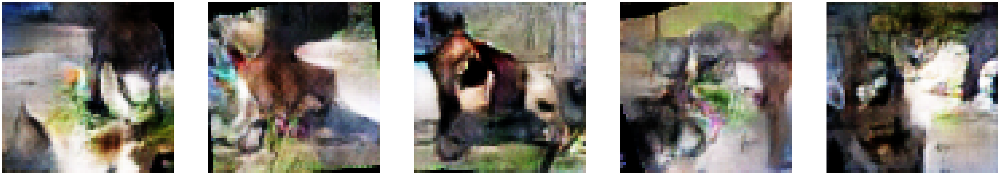

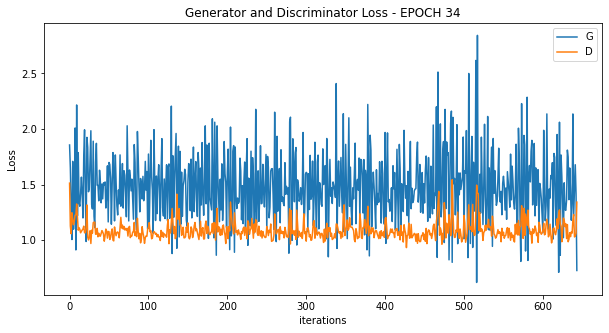

 50%|████████████████████████████████████████                                        | 322/644 [05:36<05:01,  1.07it/s]

[36/300][322/644] Loss_D: 0.9943 Loss_G: 1.8925 D(x): 0.7326 D(G(z)): 0.1692 / 0.1043


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.03s/it]

[36/300][644/644] Loss_D: 1.2466 Loss_G: 0.8415 D(x): 0.5673 D(G(z)): 0.1138 / 0.5892


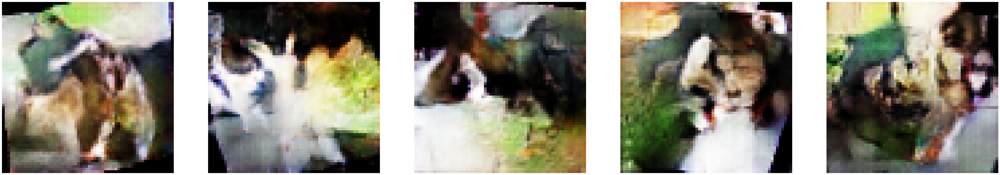

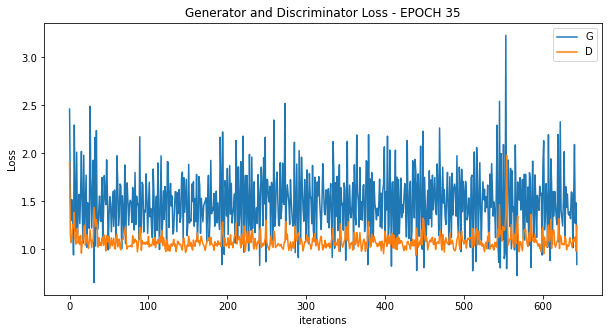

 50%|████████████████████████████████████████                                        | 322/644 [05:22<05:01,  1.07it/s]

[37/300][322/644] Loss_D: 1.0591 Loss_G: 1.4106 D(x): 0.6161 D(G(z)): 0.0921 / 0.1763


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:14<00:00,  1.05s/it]

[37/300][644/644] Loss_D: 1.1853 Loss_G: 1.0525 D(x): 0.4493 D(G(z)): 0.1797 / 0.2946


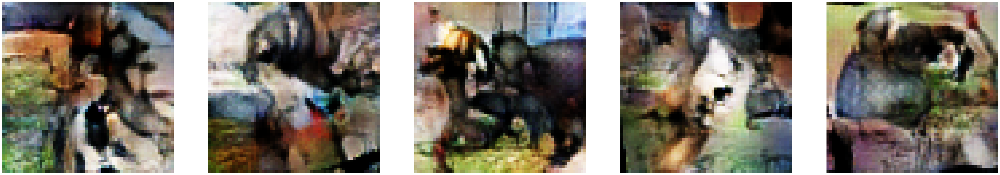

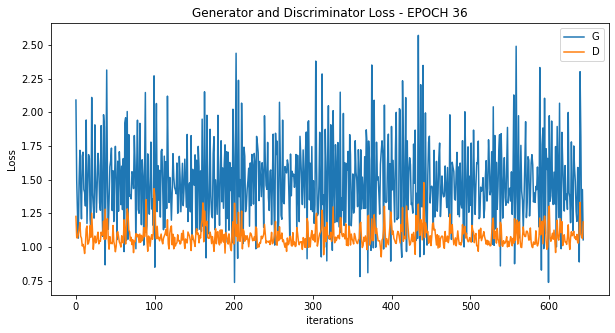

 50%|████████████████████████████████████████                                        | 322/644 [05:31<04:58,  1.08it/s]

[38/300][322/644] Loss_D: 1.0847 Loss_G: 1.8523 D(x): 0.6651 D(G(z)): 0.3188 / 0.0891


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:55<00:00,  1.02s/it]

[38/300][644/644] Loss_D: 1.1645 Loss_G: 4.5030 D(x): 0.7723 D(G(z)): 0.3329 / 0.0036


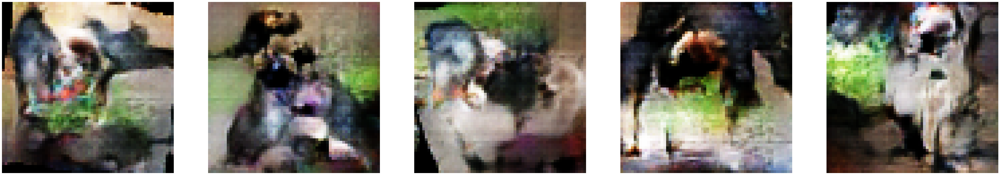

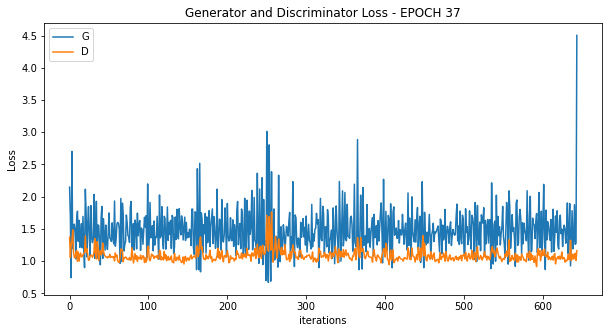

 50%|████████████████████████████████████████                                        | 322/644 [05:24<05:07,  1.05it/s]

[39/300][322/644] Loss_D: 0.9943 Loss_G: 1.4790 D(x): 0.6731 D(G(z)): 0.1608 / 0.1441


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:56<00:00,  1.02s/it]

[39/300][644/644] Loss_D: 1.7489 Loss_G: 0.5951 D(x): 0.1672 D(G(z)): 0.0520 / 0.6046


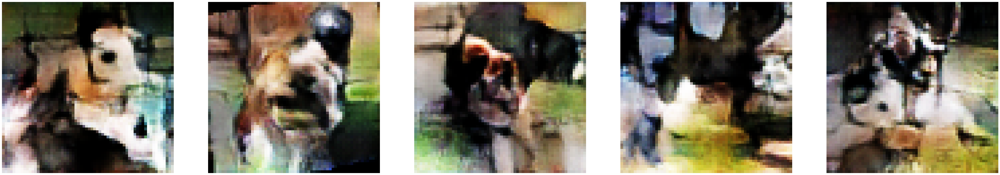

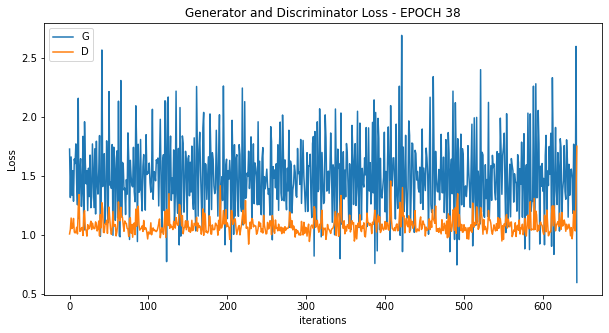

 50%|████████████████████████████████████████                                        | 322/644 [05:25<06:07,  1.14s/it]

[40/300][322/644] Loss_D: 1.0311 Loss_G: 1.6544 D(x): 0.7098 D(G(z)): 0.2297 / 0.1194


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:58<00:00,  1.02s/it]

[40/300][644/644] Loss_D: 1.2116 Loss_G: 5.8472 D(x): 0.8217 D(G(z)): 0.4153 / 0.0002


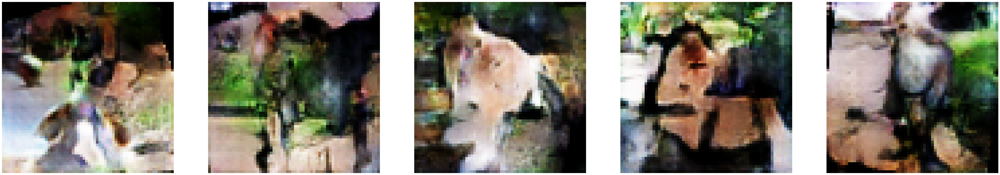

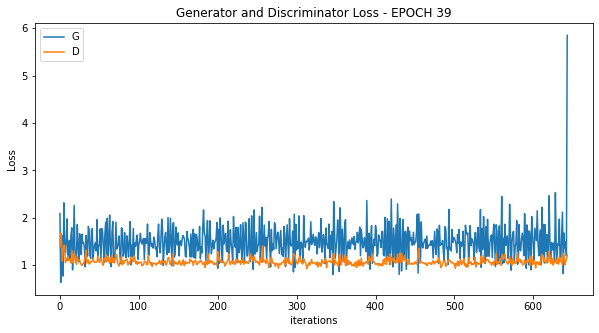

 50%|████████████████████████████████████████                                        | 322/644 [05:27<06:14,  1.16s/it]

[41/300][322/644] Loss_D: 1.1500 Loss_G: 1.4569 D(x): 0.8714 D(G(z)): 0.2445 / 0.1612


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]

[41/300][644/644] Loss_D: 1.3269 Loss_G: 2.1662 D(x): 0.8951 D(G(z)): 0.2099 / 0.0784


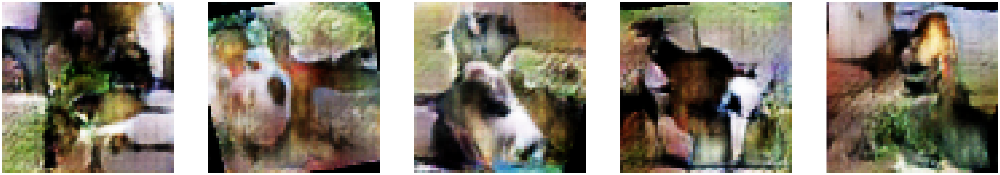

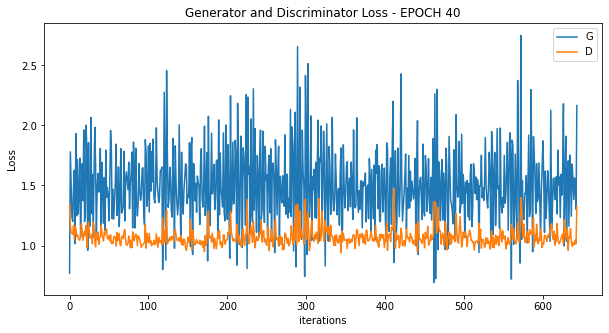

 50%|████████████████████████████████████████                                        | 322/644 [05:35<05:01,  1.07it/s]

[42/300][322/644] Loss_D: 1.0419 Loss_G: 1.1757 D(x): 0.6731 D(G(z)): 0.2170 / 0.2266


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [12:24<00:00,  1.16s/it]

[42/300][644/644] Loss_D: 1.7332 Loss_G: 0.7912 D(x): 0.2180 D(G(z)): 0.1219 / 0.8946


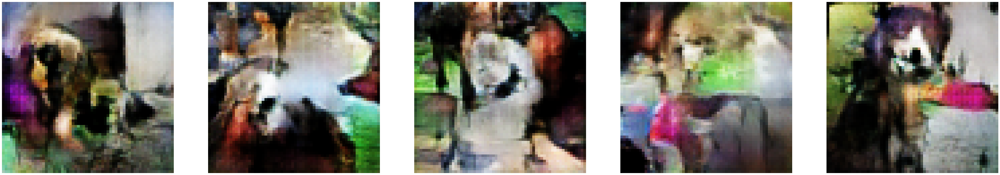

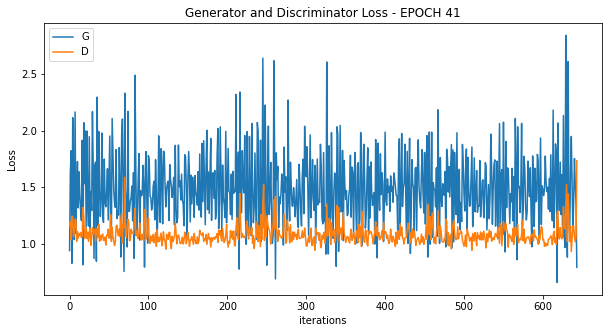

 50%|████████████████████████████████████████                                        | 322/644 [06:14<05:28,  1.02s/it]

[43/300][322/644] Loss_D: 1.1086 Loss_G: 1.1265 D(x): 0.5455 D(G(z)): 0.1889 / 0.2544


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [12:22<00:00,  1.15s/it]

[43/300][644/644] Loss_D: 0.9067 Loss_G: 2.3108 D(x): 0.8132 D(G(z)): 0.1555 / 0.1045


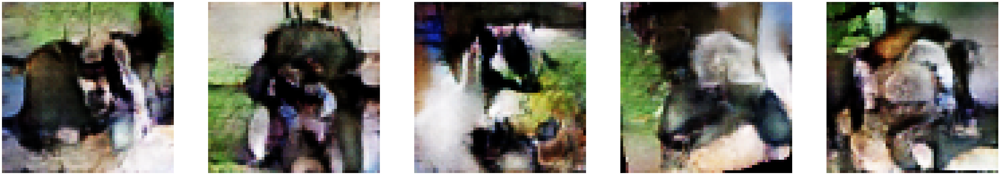

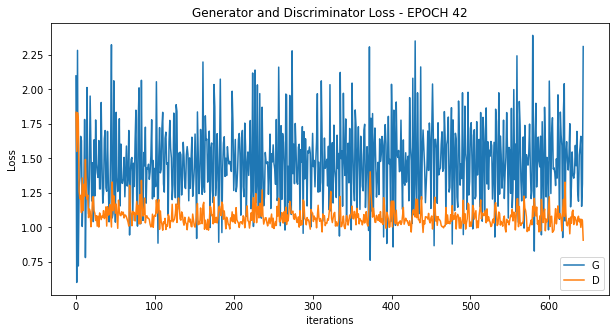

 50%|████████████████████████████████████████                                        | 322/644 [05:25<05:58,  1.11s/it]

[44/300][322/644] Loss_D: 1.0591 Loss_G: 1.7023 D(x): 0.7959 D(G(z)): 0.2446 / 0.1171


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:49<00:00,  1.01s/it]

[44/300][644/644] Loss_D: 0.9999 Loss_G: 0.6966 D(x): 0.6299 D(G(z)): 0.0590 / 0.5427


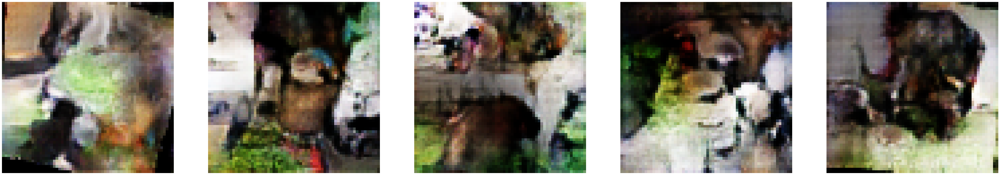

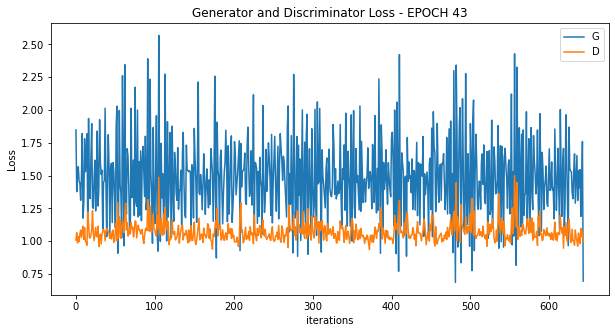

 50%|████████████████████████████████████████                                        | 322/644 [05:34<05:27,  1.02s/it]

[45/300][322/644] Loss_D: 1.0436 Loss_G: 1.3281 D(x): 0.5498 D(G(z)): 0.1020 / 0.2051


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:59<00:00,  1.02s/it]

[45/300][644/644] Loss_D: 1.1546 Loss_G: 0.7039 D(x): 0.4731 D(G(z)): 0.0738 / 0.5995


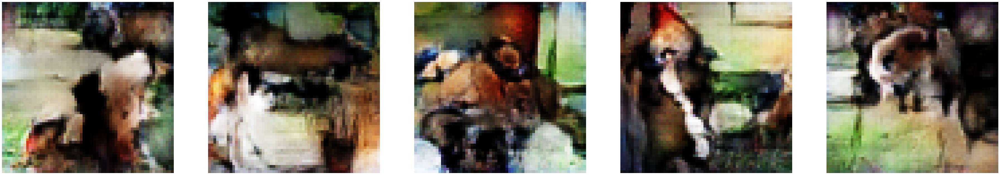

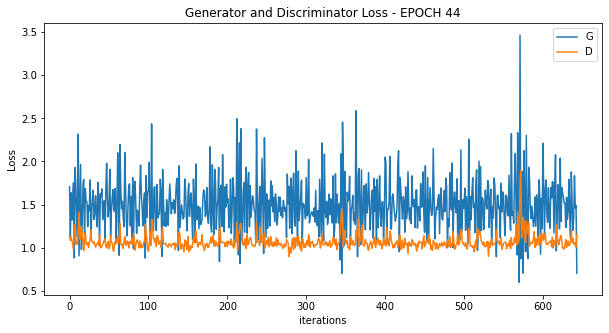

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:06,  1.05it/s]

[46/300][322/644] Loss_D: 1.0892 Loss_G: 1.3648 D(x): 0.7052 D(G(z)): 0.2894 / 0.1747


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:00<00:00,  1.03s/it]

[46/300][644/644] Loss_D: 1.0085 Loss_G: 3.4755 D(x): 0.7080 D(G(z)): 0.2563 / 0.0125


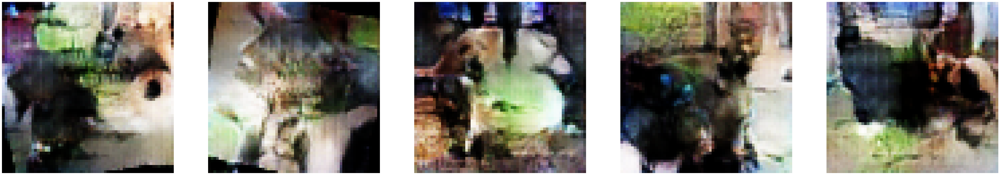

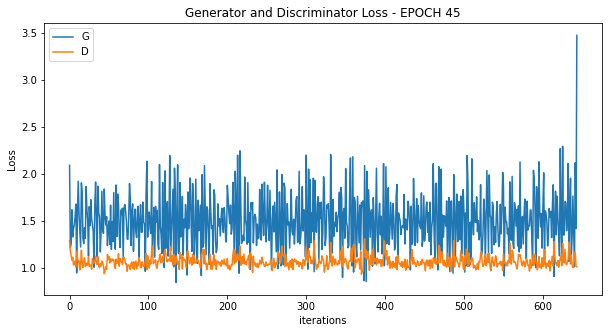

 50%|████████████████████████████████████████                                        | 322/644 [05:32<05:01,  1.07it/s]

[47/300][322/644] Loss_D: 1.0744 Loss_G: 1.3097 D(x): 0.6832 D(G(z)): 0.2821 / 0.1871


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:09<00:00,  1.04s/it]

[47/300][644/644] Loss_D: 1.0914 Loss_G: 2.9087 D(x): 0.5949 D(G(z)): 0.2365 / 0.0430


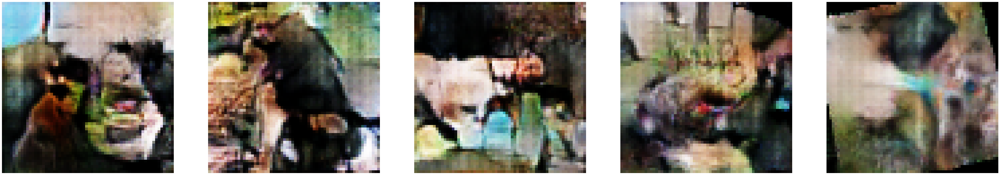

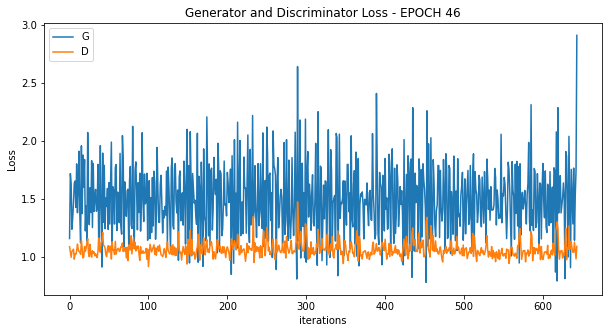

 50%|████████████████████████████████████████                                        | 322/644 [05:27<05:42,  1.06s/it]

[48/300][322/644] Loss_D: 1.0347 Loss_G: 1.0853 D(x): 0.6031 D(G(z)): 0.2000 / 0.2731


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:15<00:00,  1.05s/it]

[48/300][644/644] Loss_D: 1.3832 Loss_G: 0.6023 D(x): 0.3706 D(G(z)): 0.1627 / 0.9176


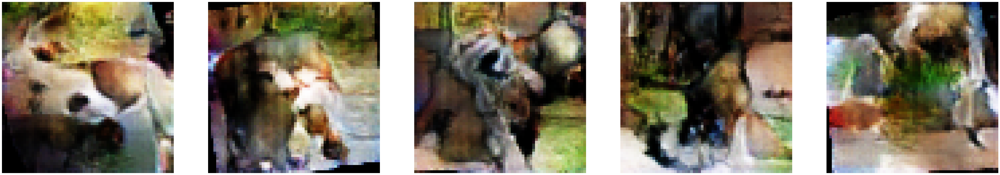

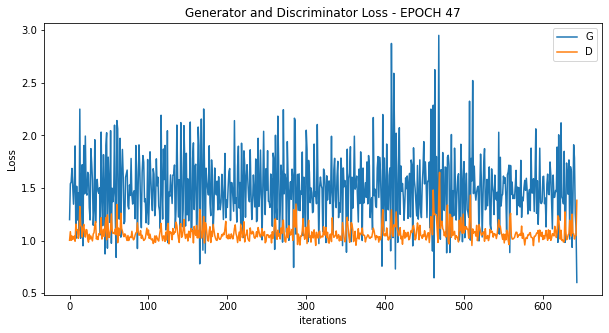

 50%|████████████████████████████████████████                                        | 322/644 [05:39<05:55,  1.10s/it]

[49/300][322/644] Loss_D: 1.1224 Loss_G: 1.6256 D(x): 0.8284 D(G(z)): 0.3220 / 0.1244


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:21<00:00,  1.06s/it]

[49/300][644/644] Loss_D: 1.2432 Loss_G: 4.5900 D(x): 0.8152 D(G(z)): 0.3610 / 0.0042


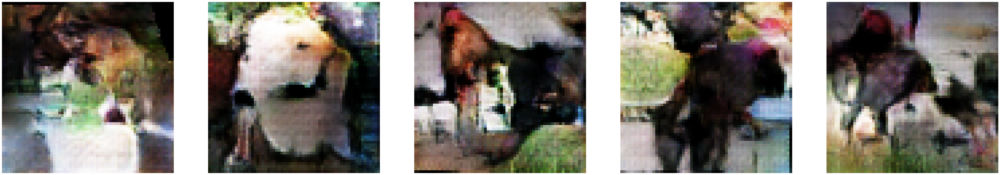

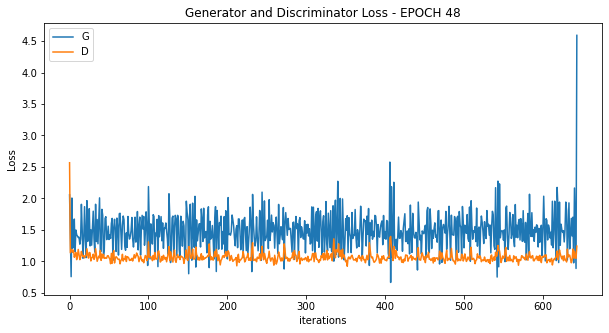

  7%|█████▌                                                                           | 44/644 [00:56<12:52,  1.29s/it]


KeyboardInterrupt: 

In [14]:
train(use_chkpt=False)

In [16]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
    
im_batch_size = 50
n_images=500

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    images
    for i_image in range(gen_images.size(0)):
        save_image((gen_images[i_image, :, :, :]+1.)/2., os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.43it/s]
